In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
%cd /content/gdrive/MyDrive/yolov8

/content/gdrive/MyDrive/yolov8


In [ ]:
!unzip /content/gdrive/MyDrive/yolov8/datasets/newegg.v1i.yolov8.zip -d /content/gdrive/MyDrive/yolov8/datasets/neweggdataset/

Archive:  /content/gdrive/MyDrive/yolov8/datasets/newegg.v1i.yolov8.zip
  inflating: /content/gdrive/MyDrive/yolov8/datasets/neweggdataset/README.roboflow.txt  
  inflating: /content/gdrive/MyDrive/yolov8/datasets/neweggdataset/data.yaml  
   creating: /content/gdrive/MyDrive/yolov8/datasets/neweggdataset/train/
   creating: /content/gdrive/MyDrive/yolov8/datasets/neweggdataset/train/images/
 extracting: /content/gdrive/MyDrive/yolov8/datasets/neweggdataset/train/images/20250211_142232_ch40_png.rf.c331913062cdb508b00605fe05d51118.jpg  
 extracting: /content/gdrive/MyDrive/yolov8/datasets/neweggdataset/train/images/20250211_142239_ch40_png.rf.840933856e8049f5d9940b252a3a93a9.jpg  
 extracting: /content/gdrive/MyDrive/yolov8/datasets/neweggdataset/train/images/20250211_142407_ch41_png.rf.8ff179576b6fc7d63a8af9c10ffcf810.jpg  
 extracting: /content/gdrive/MyDrive/yolov8/datasets/neweggdataset/train/images/20250211_142416_ch41_png.rf.c3245d88799ea8bb6614246f6b709987.jpg  
 extracting: /con

In [3]:
import os
HOME = os.getcwd()
print(HOME)

/content/gdrive/MyDrive/yolov8


## Install YOLOv8

⚠️ YOLOv8 is still under heavy development. Breaking changes are being introduced almost weekly. We strive to make our YOLOv8 notebooks work with the latest version of the library. Last tests took place on **27.01.2023** with version **YOLOv8.0.20**.

If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

YOLOv8 can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.

In [4]:
!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.2/112.6 GB disk)


In [5]:
from ultralytics import YOLO

from IPython.display import display, Image

In [6]:
%cd {HOME}/datasets

/content/gdrive/MyDrive/yolov8/datasets


In [ ]:
#!mkdir {HOME}/datasets
%cd {HOME}/datasets

#!pip install roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="AJtjXfUDdZiYwTOYIiaQ")
project = rf.workspace("egg-hchoe").project("new-egg")
version = project.version(1)
dataset = version.download("yolov8")





/content/gdrive/MyDrive/yolov8/datasets
loading Roboflow workspace...
loading Roboflow project...


## Custom Training

In [ ]:
%cd {HOME}

#!yolo task=detect mode=train model=yolov8s.pt data=/content/gdrive/MyDrive/datasets/eggdata/data.yaml epochs=20 patience=0 imgsz=800 plots=True weight = /content/gdrive/MyDrive/yolov8/runs/detect/train7/weights/best.pt
!yolo task=detect mode=train model=yolov8s.pt data=/content/gdrive/MyDrive/yolov8/datasets/neweggdataset/data.yaml epochs=50 patience=0 imgsz=800 plots=True pretrained=/content/gdrive/MyDrive/yolov8/runs/detect/train7/weights/best.pt


/content/gdrive/MyDrive/yolov8
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/tasks.py:567: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map

In [ ]:
!ls {HOME}/runs/detect/train13/


args.yaml					    P_curve.png       train_batch2.jpg
confusion_matrix_normalized.png			    PR_curve.png      train_batch760.jpg
confusion_matrix.png				    R_curve.png       train_batch761.jpg
events.out.tfevents.1740035183.4cf3ed26d33d.5761.0  results.csv       train_batch762.jpg
F1_curve.png					    results.png       val_batch0_labels.jpg
labels_correlogram.jpg				    train_batch0.jpg  val_batch0_pred.jpg
labels.jpg					    train_batch1.jpg  weights


/content/gdrive/MyDrive/yolov8


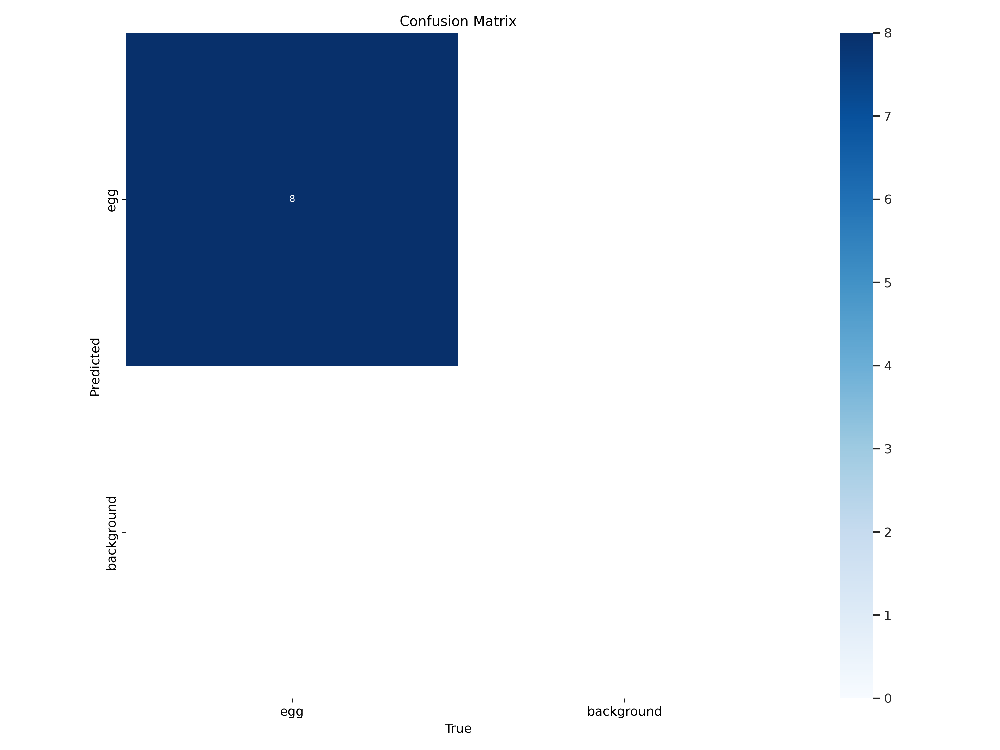

In [ ]:
#from keras.preprocessing.image import ImageDataGenerator
#from keras.preprocessing import image
%cd {HOME}
#Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)
Image(filename=f'runs/detect/train13/confusion_matrix.png', width=600)

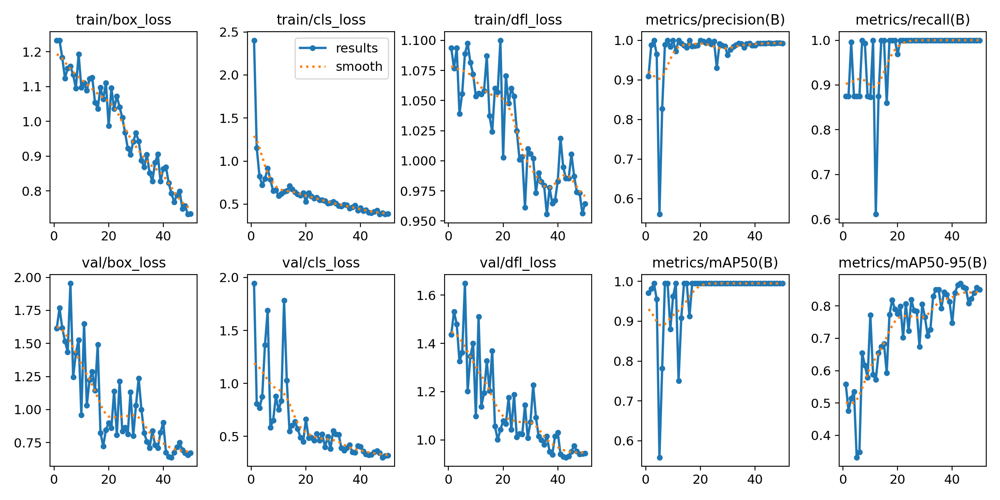

In [ ]:
#%cd {HOME}
#Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)
Image(filename=f'runs/detect/train13/results.png', width=600)

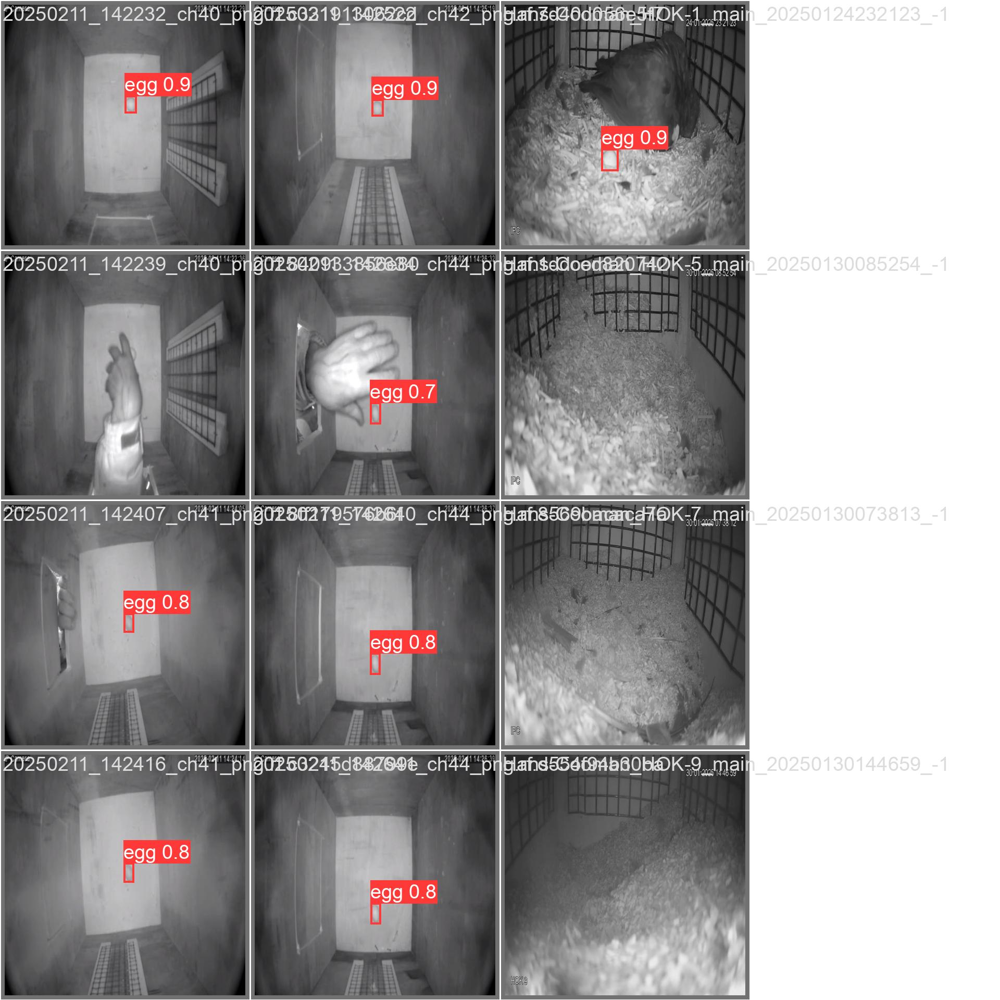

In [ ]:
#%cd {HOME}
Image(filename=f'runs/detect/train13/val_batch0_pred.jpg', width=600)

## Validate Custom Model

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model=runs/detect/train13/weights/best.pt data=/content/gdrive/MyDrive/datasets/eggdata/data.yaml

/content/gdrive/MyDrive/yolov8
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/tasks.py:567: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map

## Inference with Custom Model

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train7/weights/best.pt conf=0.25 source=/content/gdrive/MyDrive/datasets/eggdata/data.yaml save=False

/content/gdrive/MyDrive/yolov8
/usr/local/lib/python3.10/dist-packages/ultralytics/nn/tasks.py:567: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map

In [9]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train13/weights/best.pt conf=0.25 source=/content/gdrive/MyDrive/yolov8/egg-data/*.jpg save=True

/content/gdrive/MyDrive/yolov8
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/tasks.py:567: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map

**NOTE:** Let's take a look at few results.

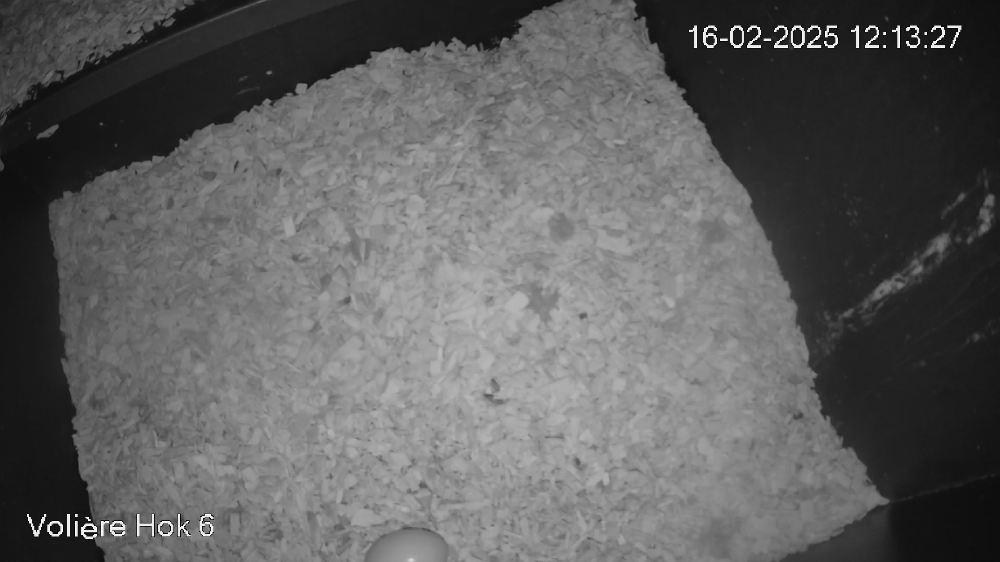

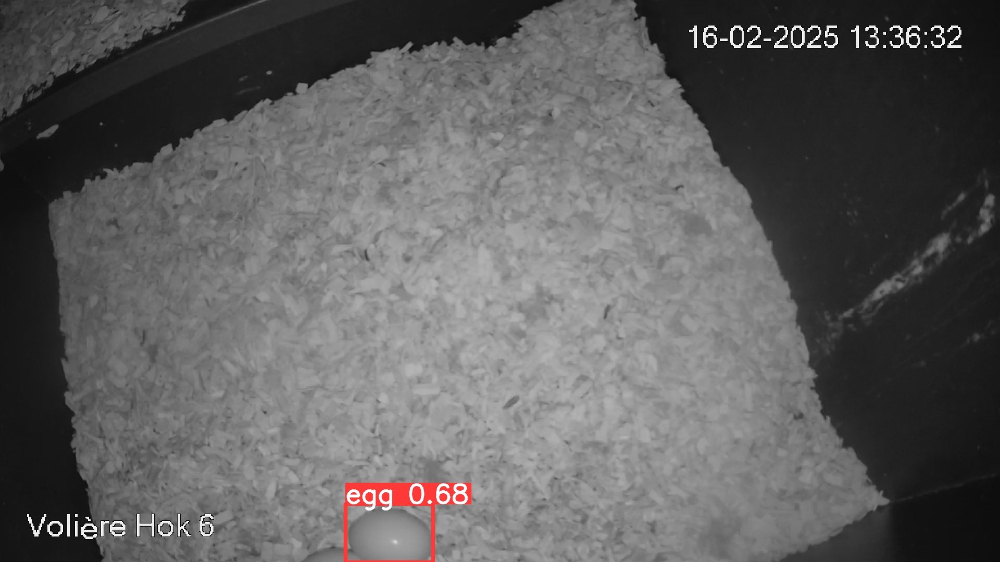

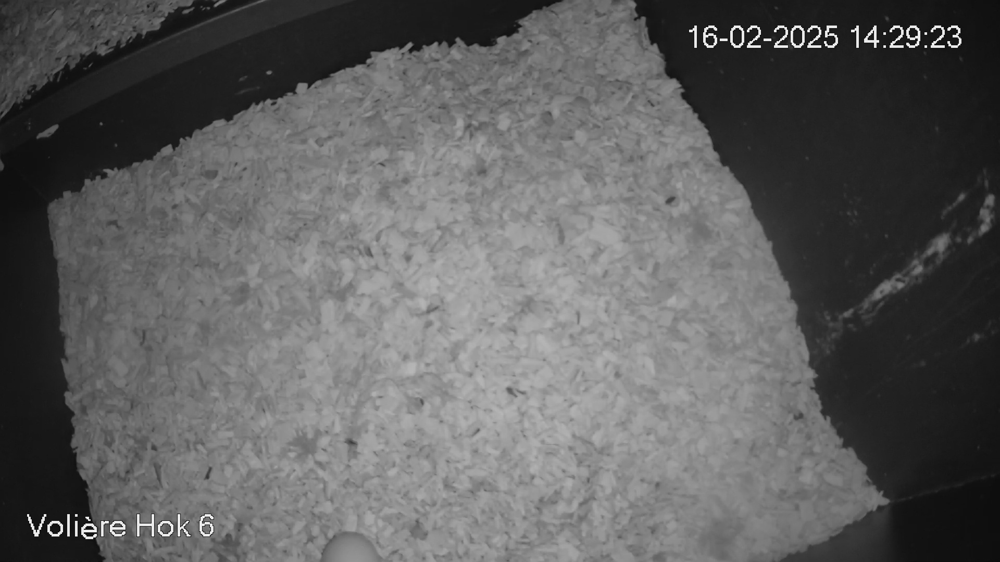

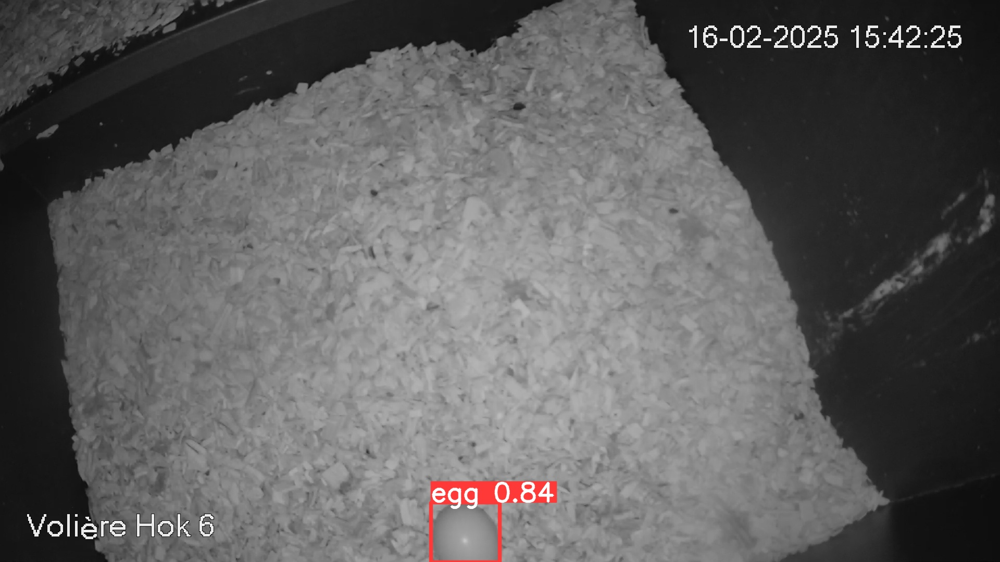

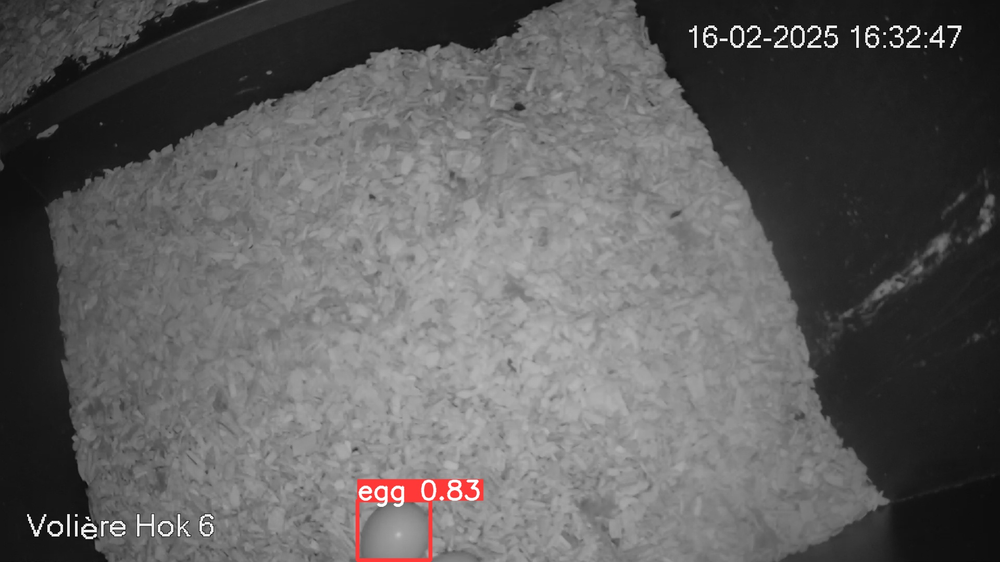

...

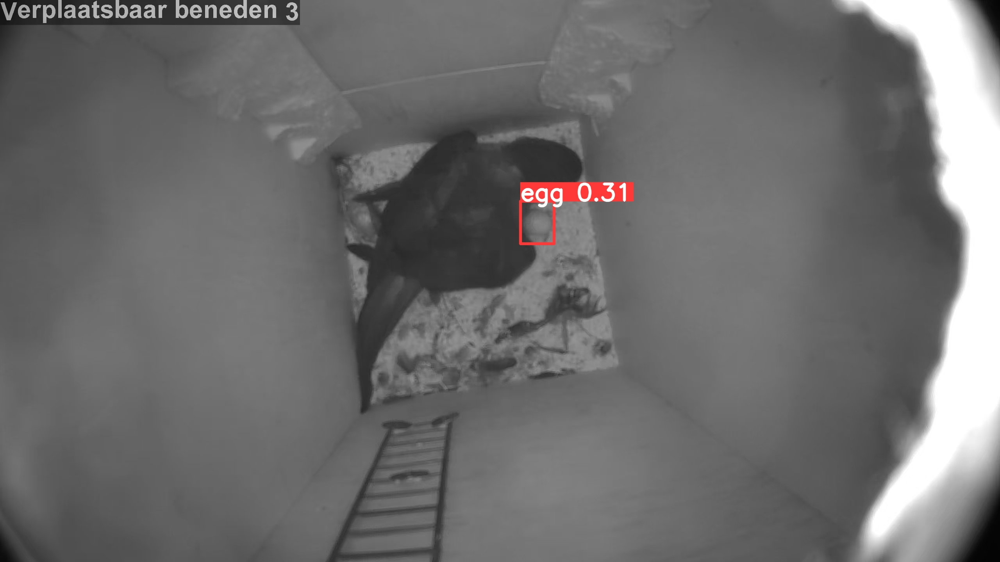

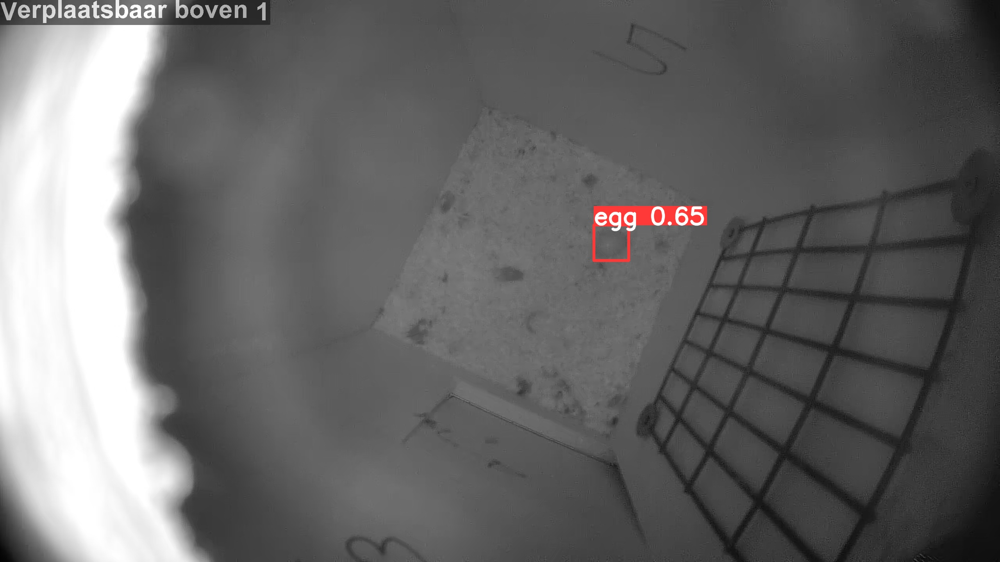

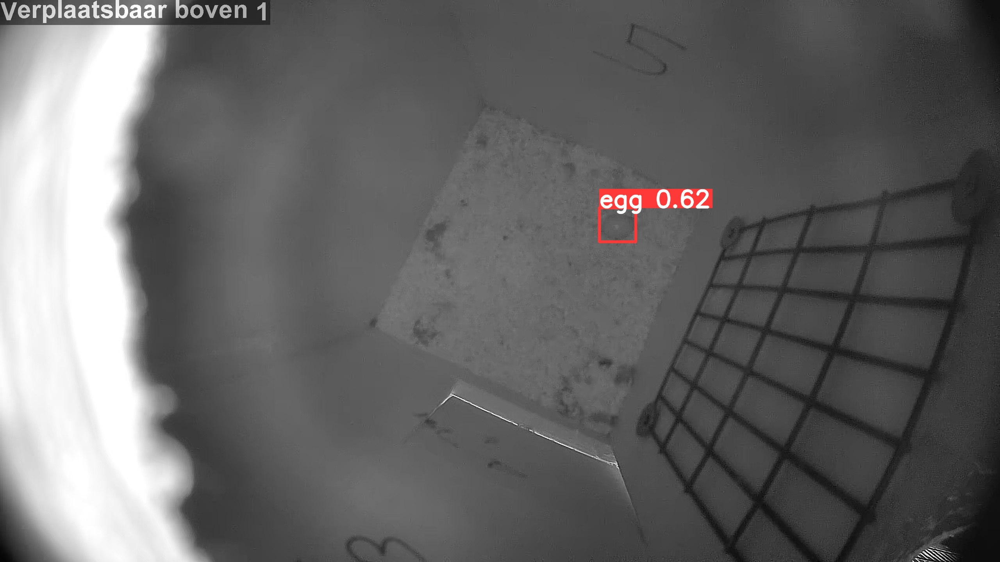

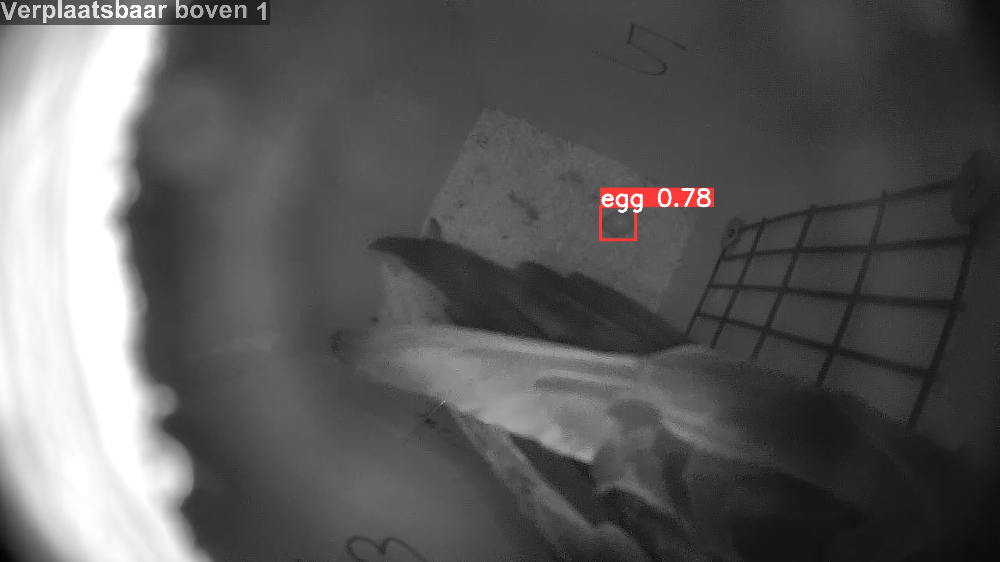

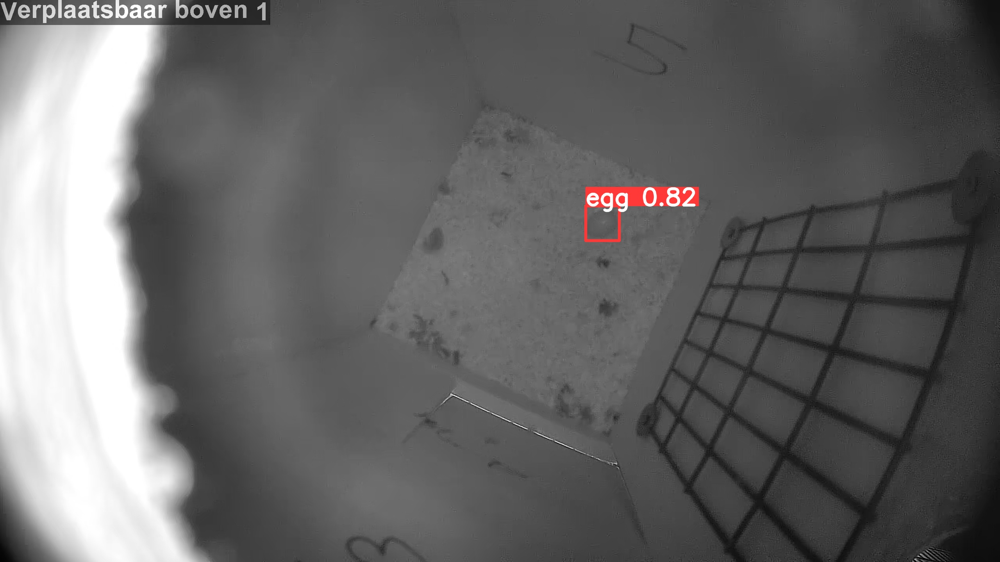

In [11]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict3/*.jpg')[:21]:
      display(Image(filename=image_path, width=600))
      print("\n")